In [1]:
dirFile <- "/Users/hoang/Documents/SaveDataFromServer/SimulatedData/CCandDN2classesMay/"
fileN0 <- dir(dirFile, "RData")

#fileN0 <- fileN0[grep("2classes.6", fileN0)]
#fileN <- fileN[grep(".1000.|.2000.", fileN, invert = TRUE)]
fileN0 <- fileN0[grep("10000|5000|20000", fileN0)]

library("coda")
library("rstan")

Loading required package: ggplot2
Warning message:
: package ‘ggplot2’ was built under R version 3.2.4rstan (Version 2.9.0, packaged: 2016-01-05 16:17:47 UTC, GitRev: 05c3d0058b6a)
For execution on a local, multicore CPU with excess RAM we recommend calling
rstan_options(auto_write = TRUE)
options(mc.cores = parallel::detectCores())

Attaching package: ‘rstan’

The following object is masked from ‘package:coda’:

    traceplot



## Lower Gamma 0

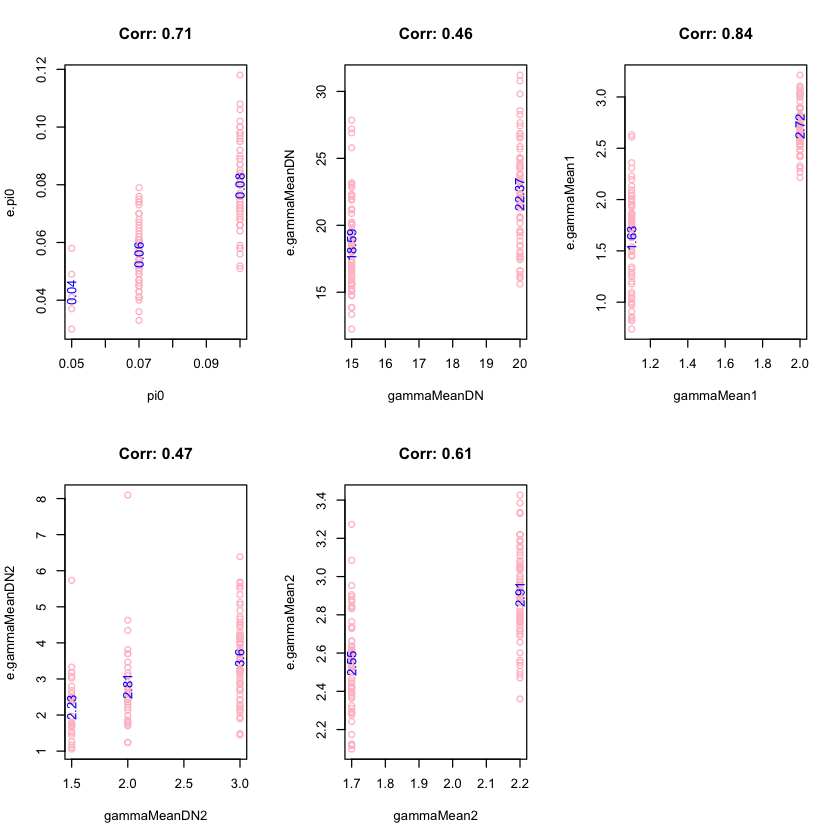

In [2]:
i = 1
fileN <- fileN0[grep("lowerHyperGamma.0.casecontrol", fileN0)]
outData <- NULL
for (i in 1:length(fileN)){
  load(paste(dirFile, fileN[i], sep = ""))
    b1 <- as.data.frame(testFitSingleCC)
s <- mcmc(b1)
b1S <- HPDinterval(s)
outDataTemp <- NULL
for (i in 1:dim(b1S)[1]){
  lLimit <- b1S[i, 1]
  uLimit <- b1S[i, 2]
  tempD <- b1[, i]
  outDataTemp[i] <- median(tempD[(tempD > lLimit) & (tempD < uLimit)])
}
   
  
  b0 <- c(pi0, gammaMeanDenovo, gammaMean, gammaMeanDenovo2, gammaMean2)
  b01 <- round(outDataTemp, 3)[1:5]
#  b02 <- abs(b0 - b01)
  outData <- rbind(outData, c(b0, b01))
}

rownames(outData) <- fileN
rName <- c("pi0", 'gammaMeanDN', 'gammaMean1', 'gammaMeanDN2', 'gammaMean2')
eName <- c("e.pi0", 'e.gammaMeanDN', 'e.gammaMean1', 'e.gammaMeanDN2', 'e.gammaMean2')

par(mfrow = c(2, 3))
for (j in 1:5){
  corJ <- round(cor(outData[, j], outData[, j + 5]), 2)
plot(outData[, j], outData[, j + 5], xlab = rName[j], ylab = eName[j], 
     main = paste('Corr: ', corJ, sep = ''), col = 'pink')
        sTemp <- sapply(split(outData[, j + 5], outData[, j]), mean)
sTemp
text(as.numeric(names(sTemp)), sTemp, round(sTemp, 2), col = 'blue', lwd = 1.5, srt = '90')

}
b2 <- outData[order(abs(outData[, 3])), ]

In [3]:
cTemp <- data.frame(outData) 
colnames(cTemp) <- c(rName, eName)
head(cTemp, 2)
x <- cTemp$e.gammaMean1
y <- cTemp$gammaMean1
e.NLS <- nls(y ~ a0*x/(b0*x + c0), start = list(a0 = -2, b0 = 1, c0 = 1))
#eA <- coef(e.NLS)['a']
#eB <- coef(e.NLS)['b']


,pi0,gammaMeanDN,gammaMean1,gammaMeanDN2,gammaMean2,e.pi0,e.gammaMeanDN,e.gammaMean1,e.gammaMeanDN2,e.gammaMean2
result.nIter.1000016_28_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.1.7.gammaMeanDenovo2.3.pi0.0.05.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.05,15,1.1,3,1.7,0.03,22.278,1.801,5.571,2.905
result.nIter.1000016_28_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.2.2.gammaMeanDenovo2.3.pi0.0.05.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.05,15,1.1,3,2.2,0.041,17.407,2.359,3.982,2.892


ERROR: Error in nlsModel(formula, mf, start, wts): singular gradient matrix at initial parameter estimates


## Lower Gamma 0.5

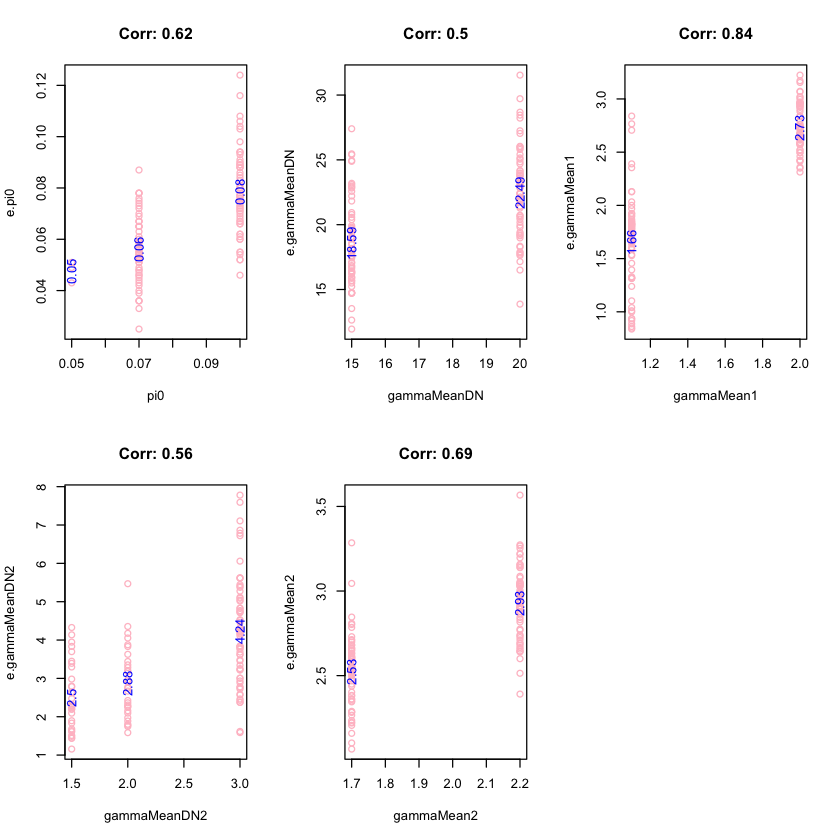

In [4]:
i = 1
fileN <- fileN0[grep("lowerHyperGamma.0.5.casecontrol", fileN0)]
outData <- NULL
for (i in 1:length(fileN)){
  load(paste(dirFile, fileN[i], sep = ""))
    b1 <- as.data.frame(testFitSingleCC)
s <- mcmc(b1)
b1S <- HPDinterval(s)
outDataTemp <- NULL
for (i in 1:dim(b1S)[1]){
  lLimit <- b1S[i, 1]
  uLimit <- b1S[i, 2]
  tempD <- b1[, i]
  outDataTemp[i] <- median(tempD[(tempD > lLimit) & (tempD < uLimit)])
}
   
  
  b0 <- c(pi0, gammaMeanDenovo, gammaMean, gammaMeanDenovo2, gammaMean2)
  b01 <- round(outDataTemp, 3)[1:5]
#  b02 <- abs(b0 - b01)
  outData <- rbind(outData, c(b0, b01))
}

rownames(outData) <- fileN
rName <- c("pi0", 'gammaMeanDN', 'gammaMean1', 'gammaMeanDN2', 'gammaMean2')
eName <- c("e.pi0", 'e.gammaMeanDN', 'e.gammaMean1', 'e.gammaMeanDN2', 'e.gammaMean2')

par(mfrow = c(2, 3))
for (j in 1:5){
  corJ <- round(cor(outData[, j], outData[, j + 5]), 2)
plot(outData[, j], outData[, j + 5], xlab = rName[j], ylab = eName[j], 
     main = paste('Corr: ', corJ, sep = ''), col = 'pink')
        sTemp <- sapply(split(outData[, j + 5], outData[, j]), mean)
sTemp
text(as.numeric(names(sTemp)), sTemp, round(sTemp, 2), col = 'blue', lwd = 1.5, srt = '90')

}
b2 <- outData[order(abs(outData[, 3])), ]

,pi0,gammaMeanDN,gammaMean1,gammaMeanDN2,gammaMean2,e.pi0,e.gammaMeanDN,e.gammaMean1,e.gammaMeanDN2,e.gammaMean2
result.nIter.1000016_29_May_09_2016.gammaMeanDN.2.gammaMeanDenovo.15.gammaMeanDN2.2.2.gammaMeanDenovo2.3.pi0.0.05.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.5.casecontrolAndDenovo.2classes.6.RData,0.05,15,2,3,2.2,0.051,16.631,2.583,5.374,2.928
result.nIter.1000016_29_May_09_2016.gammaMeanDN.2.gammaMeanDenovo.20.gammaMeanDN2.1.7.gammaMeanDenovo2.3.pi0.0.05.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.5.casecontrolAndDenovo.2classes.6.RData,0.05,20,2,3,1.7,0.043,25.415,2.678,6.721,2.102


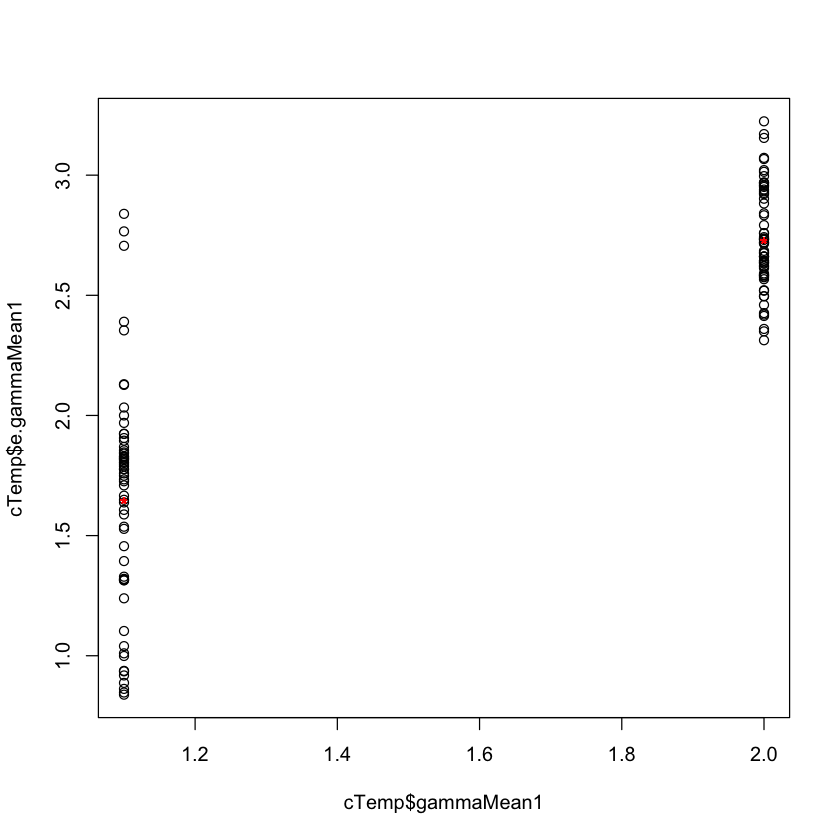

In [5]:
cTemp <- data.frame(outData) 
colnames(cTemp) <- c(rName, eName)
head(cTemp, 2)
#e.NLS <- nls(e.gammaMean1 ~ a*gammaMean1 + b, data = cTemp, start = list(a = 1, b = 1))
#eA <- coef(e.NLS)['a']
#eB <- coef(e.NLS)['b']
eA <- 1.20270499736254
eB <- 0.32326692835185
plot(cTemp$e.gammaMean1 ~ cTemp$gammaMean1)
text(cTemp$gammaMean1, eA*cTemp$gammaMean1 + eB, '*', col = 'red')

## Lower Gamma 1

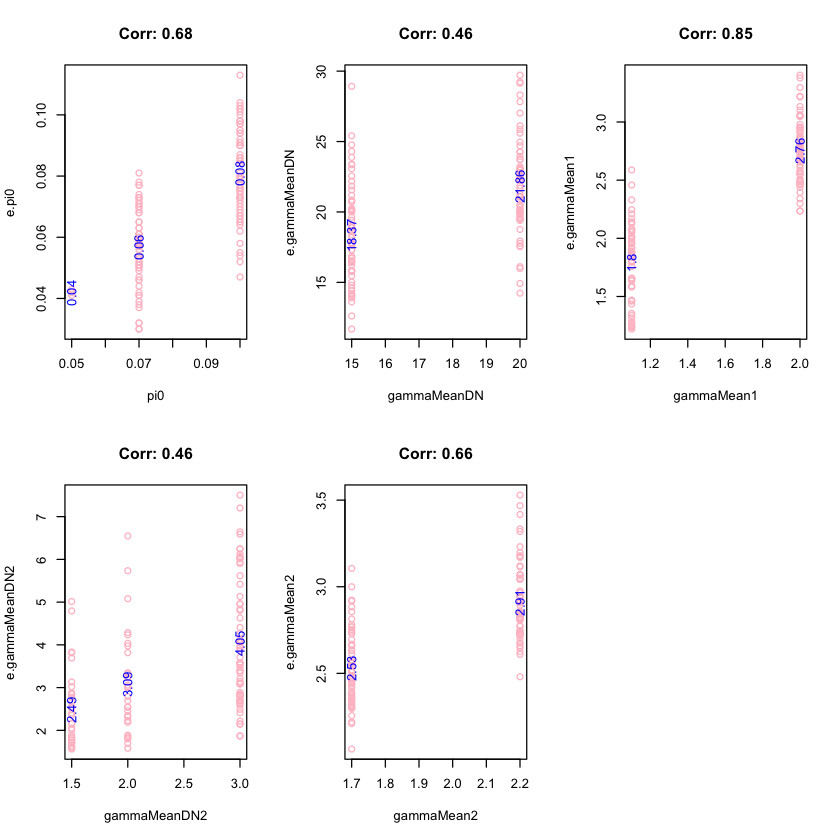

In [2]:
i = 1
fileN <- fileN0[grep("lowerHyperGamma.1.casecontrol", fileN0)]

outData <- NULL
for (i in 1:length(fileN)){
  load(paste(dirFile, fileN[i], sep = ""))
    b1 <- as.data.frame(testFitSingleCC)
s <- mcmc(b1)
b1S <- HPDinterval(s)
outDataTemp <- NULL
for (i in 1:dim(b1S)[1]){
  lLimit <- b1S[i, 1]
  uLimit <- b1S[i, 2]
  tempD <- b1[, i]
  outDataTemp[i] <- median(tempD[(tempD > lLimit) & (tempD < uLimit)])
}
   
  
  b0 <- c(pi0, gammaMeanDenovo, gammaMean, gammaMeanDenovo2, gammaMean2)
  b01 <- round(outDataTemp, 3)[1:5]
#  b02 <- abs(b0 - b01)
  outData <- rbind(outData, c(b0, b01))
}

rownames(outData) <- fileN
rName <- c("pi0", 'gammaMeanDN', 'gammaMean1', 'gammaMeanDN2', 'gammaMean2')
eName <- c("e.pi0", 'e.gammaMeanDN', 'e.gammaMean1', 'e.gammaMeanDN2', 'e.gammaMean2')

par(mfrow = c(2, 3))
for (j in 1:5){
  corJ <- round(cor(outData[, j], outData[, j + 5]), 2)
plot(outData[, j], outData[, j + 5], xlab = rName[j], ylab = eName[j], 
     main = paste('Corr: ', corJ, sep = ''), col = 'pink')
        sTemp <- sapply(split(outData[, j + 5], outData[, j]), mean)
sTemp
text(as.numeric(names(sTemp)), sTemp, round(sTemp, 2), col = 'blue', lwd = 1.5, srt = '90')

}
b2 <- outData[order(abs(outData[, 3])), ]

## Lower Gamma 2

In [ ]:
i = 1
fileN <- fileN0[grep("lowerHyperGamma.2.casecontrol", fileN0)]

outData <- NULL
for (i in 1:length(fileN)){
  load(paste(dirFile, fileN[i], sep = ""))
    b1 <- as.data.frame(testFitSingleCC)
s <- mcmc(b1)
b1S <- HPDinterval(s)
outDataTemp <- NULL
for (i in 1:dim(b1S)[1]){
  lLimit <- b1S[i, 1]
  uLimit <- b1S[i, 2]
  tempD <- b1[, i]
  outDataTemp[i] <- median(tempD[(tempD > lLimit) & (tempD < uLimit)])
}
   
  
  b0 <- c(pi0, gammaMeanDenovo, gammaMean, gammaMeanDenovo2, gammaMean2)
  b01 <- round(outDataTemp, 3)[1:5]
#  b02 <- abs(b0 - b01)
  outData <- rbind(outData, c(b0, b01))
}

rownames(outData) <- fileN
rName <- c("pi0", 'gammaMeanDN', 'gammaMean1', 'gammaMeanDN2', 'gammaMean2')
eName <- c("e.pi0", 'e.gammaMeanDN', 'e.gammaMean1', 'e.gammaMeanDN2', 'e.gammaMean2')

par(mfrow = c(2, 3))
for (j in 1:5){
  corJ <- round(cor(outData[, j], outData[, j + 5]), 2)
plot(outData[, j], outData[, j + 5], xlab = rName[j], ylab = eName[j], 
     main = paste('Corr: ', corJ, sep = ''), col = 'pink')
        sTemp <- sapply(split(outData[, j + 5], outData[, j]), mean)
sTemp
text(as.numeric(names(sTemp)), sTemp, round(sTemp, 2), col = 'blue', lwd = 1.5, srt = '90')

}
b2 <- outData[order(abs(outData[, 3])), ]

# Test FDR

In [36]:
source("TADA/TADA.R")
BayesFactorCC <- function(pi, x.case, x.control, 
                         gamma.meanCC, betaCC, rhoCC, nuCC, q.lower = 10^-8, q.upper = 0.1){
  altCC <- apply(cbind(x.case, x.control), 1, function(y){
    x2 <- list(ca = y[1], cn = y[2])
    t1 <- evidence.alt.CC(x = x2, N = Nall, gamma.mean = gamma.meanCC, beta = betaCC, rho1 = rhoCC, nu1 = nuCC, q.lower = q.lower, q.upper = q.upper)$total
    return(t1)
  })
  nullCC <- apply(cbind(x.case, x.control), 1, function(y){
    x1 <- list(ca = y[1], cn = y[2])
    t1 <- evidence.null.CC(x = x1, N = Nall, rho0 = rhoCC, nu0 = nuCC)$total
    return(t1)
  })
  
  return(altCC/nullCC)
}

fileN <- fileN0 #[1:5]

listGeneFDR03 <- NULL
listGeneTop100 <- NULL
Nall <- N
Nall
fileTemp <- fileN[1]

fData <- NULL

for (kk in 1:length(fileN)){
    fileTemp <- fileN[kk]
    load(paste(dirFile, fileTemp, sep = ""))
    data <- data.frame(counts, (sDenovoCC2$sample.info[, 2]))
    
    bM <- as.data.frame(testFitSingleCC)

    lThreshold <- 0.05
    uThreshold <- 0.95
    bOut <- apply(bM, 2, function(x) {
  y <- x[(x > quantile(x, lThreshold)) & (x < quantile(x, uThreshold))]
  return(y)
})

    e.pi0 <- mean(bOut[, 'pi0'])
    e.hyperGammaMeanLoFdn <- mean(bOut[, 'hyperGammaMeanLoFdn'])
    
    e.hyperGammaMeanMis3dn <- mean(bOut[, 'hyperGammaMeanMis3dn'])

    e.hyperBetaLoFdn <- mean(bOut[, 'hyperBetaLoFdn'])
        e.hyperBetaMis3dn <- mean(bOut[, 'hyperBetaMis3dn'])

    BFdnLoF <- bayes.factor.denovo(x = yLoF, N = N$dn, mu = mutLoF, gamma.mean = e.hyperGammaMeanLoFdn, beta = e.hyperBetaLoFdn)

    BFdnMis3 <- bayes.factor.denovo(x = yMis3, N = N$dn, mu = mutMis3, 
                                gamma.mean = e.hyperGammaMeanMis3dn, beta = e.hyperBetaMis3dn)

 
         
          e.hyperGammaMeanLoFcc <- mean(bOut[, 'hyperGammaMeanLoFcc'])
    e.hyperGammaMeanMis3cc <- mean(bOut[, 'hyperGammaMeanMis3cc'])
            e.hyperBetaLoFcc <- mean(bOut[, 'hyperBetaLoFcc'])
    e.hyperBetaMis3cc <- mean(bOut[, 'hyperBetaMis3cc'])

        e.hyperGammaMeanLoFcc
    e.pi0
    
        nu.lof <- nu0[1]
        rho.lof <- sum(y.control.lof)/(dim(data)[1]*N$cn)*nu.lof
    
    rho.lof <- rhoCC*nu.lof
    
        BFccLoF <- BayesFactorCC(pi = e.pi0, x.case = y.case.lof, x.control = y.control.lof,
                    gamma.meanCC = e.hyperGammaMeanLoFcc, betaCC = e.hyperBetaLoFcc,
                    rhoCC = rho.lof, nuCC = nu.lof)

                

        range(BFccLoF)
                nu.mis3 <- nu0[1]

        rho.mis3 <- sum(y.control.mis3)/(dim(data)[1]*N$cn)*nu.mis3
    rho.mis3 <- rhoCC2*nu.mis3
    
    BFccMis3 <- BayesFactorCC(pi = e.pi0, x.case = y.case.mis3, x.control = y.control.mis3,
                    gamma.meanCC = e.hyperGammaMeanMis3cc, betaCC = e.hyperBetaMis3cc,
                    rhoCC = rho.mis3, nuCC = nu.mis3)

        range(BFccMis3)


        BFall <- BFccMis3*BFccLoF*BFdnLoF*BFdnMis3

    
#  data <- data.frame(counts)  

data$BF <- BFall
data <- data[order(-data$BF),]
pi0A <- 1 - e.pi0
data$qvalue <- Bayesian.FDR(data$BF, pi0A)$FDR

data1 <- (data[data$qvalue < 0.3, ])
dim(data1)

#testBF <- cbind(data0, BFdnLoF, BFdnMis3, BFccLoF, BFccMis3, 
 #               y.case.mis3, y.control.mis3)


#write.table(data, paste("../data/FDR.oldBayesFactorCC.", fileTemp,  sep = ""), row.names =FALSE, quote = FALSE)
 #   listGeneFDR03[[kk]] <- as.character(data1[, 1])
  #  listGeneTop100[[kk]] <- as.character(head(data, 100)[, 1])
    f12 <- c(e.pi0, e.hyperGammaMeanLoFdn, e.hyperGammaMeanLoFcc, e.hyperGammaMeanMis3dn, e.hyperGammaMeanMis3cc)
    f11 <- c(pi0, gammaMeanDenovo, gammaMean, gammaMeanDenovo2, gammaMean2)

    fdr005 <- dim(data[data$qvalue < 0.05, ])[1]
    fdr01 <- dim(data[data$qvalue < 0.1, ])[1]
    fdr03 <- dim(data[data$qvalue < 0.3, ])[1]

    fData <- rbind(fData, c(f11, f12, fdr005, fdr01, fdr03))
    }

$dn
[1] 1024

$ca
[1] 5571

$cn
[1] 6856

In [45]:
colnames(fData) <- c("pi", "gDN1", "gCC1", "gDN2", "gCC2",
                    "epi", "egDN1", "egCC1", "egDN2", "egCC2",
                    "fdr005", "fdr01", "fdr03")
fData1 <- data.frame(fData)
head(fData)
dim(fData)

,pi,gDN1,gCC1,gDN2,gCC2,epi,egDN1,egCC1,egDN2,egCC2,fdr005,fdr01,fdr03
result.nIter.1000016_28_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.1.7.gammaMeanDenovo2.3.pi0.0.05.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.05000000,15.00000000,1.10000000,3.00000000,1.70000000,0.02978831,22.53020767,1.85622114,5.78869494,2.91738284,10.00000000,13.00000000,24.00000000
result.nIter.1000016_28_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.2.2.gammaMeanDenovo2.3.pi0.0.05.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.0500000,15.0000000,1.1000000,3.0000000,2.2000000,0.0412048,17.9237249,2.3574891,4.2814627,2.8920690,23.0000000,27.0000000,45.0000000
result.nIter.1000016_28_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.2.2.gammaMeanDenovo2.3.pi0.0.05.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.1.casecontrolAndDenovo.2classes.6.RData,0.05000000,15.00000000,1.10000000,3.00000000,2.20000000,0.04158011,14.48617543,2.02880134,3.90540101,3.21892088,28.00000000,32.00000000,49.00000000
result.nIter.1000016_28_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.20.gammaMeanDN2.2.2.gammaMeanDenovo2.3.pi0.0.05.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.05000000,20.00000000,1.10000000,3.00000000,2.20000000,0.03735579,25.00714711,2.33825984,5.94952327,3.36715881,21.00000000,25.00000000,43.00000000
result.nIter.1000016_29_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.20.gammaMeanDN2.2.2.gammaMeanDenovo2.3.pi0.0.05.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.1.casecontrolAndDenovo.2classes.6.RData,0.0500000,20.0000000,1.1000000,3.0000000,2.2000000,0.0433488,20.0003547,1.3378530,6.2664446,3.2485600,21.0000000,24.0000000,40.0000000
result.nIter.1000016_29_May_09_2016.gammaMeanDN.2.gammaMeanDenovo.15.gammaMeanDN2.1.7.gammaMeanDenovo2.3.pi0.0.05.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.1.casecontrolAndDenovo.2classes.6.RData,0.05000000,15.00000000,2.00000000,3.00000000,1.70000000,0.04156496,12.78722497,3.18755819,5.88239296,2.38482235,23.00000000,28.00000000,45.00000000


[1] 382  13

In [41]:
rownames(fData) <- fileN0
#write.table(fData, "../data/SimulatedDataOut.txt", col.names = FALSE, quote = FALSE)

In [84]:
fData2 <- data.frame(fData)
#fData2$testSum <- apply(abs(fData[, 1:5] - fData[, 6:10])/fData[, 1:5], 1, sum)# /fData[, 1:5]))
fData2$testSum <- abs(fData[, 1] - fData[, 6])/fData[, 1]
#fData2 <- fData[order(-fData2$testSum), ]
fData2 <- apply(fData2[order(fData2$testSum), ], 2, function(x) round(x, 3))

tail(fData2, 20)
    head(fData2, 20)
    

,pi,gDN1,gCC1,gDN2,gCC2,epi,egDN1,egCC1,egDN2,egCC2,fdr005,fdr01,fdr03,testSum
result.nIter.500018_22_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.20.gammaMeanDN2.1.7.gammaMeanDenovo2.3.pi0.0.07.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.1.casecontrolAndDenovo.2classes.6.RData,0.070,20.000,1.100,3.000,1.700,0.038,25.020,2.177,4.745,2.770,13.000,16.000,27.000,0.453
result.nIter.1000019_19_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.1.7.gammaMeanDenovo2.2.pi0.0.1.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.1.casecontrolAndDenovo.2classes.6.RData,0.100,15.000,1.100,2.000,1.700,0.054,25.077,1.911,2.834,2.805,20.000,24.000,45.000,0.459
result.nIter.500019_19_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.1.7.gammaMeanDenovo2.3.pi0.0.1.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.5.casecontrolAndDenovo.2classes.6.RData,0.100,15.000,1.100,3.000,1.700,0.054,25.712,1.807,4.780,2.560,23.000,28.000,49.000,0.464
result.nIter.500019_19_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.1.7.gammaMeanDenovo2.1.5.pi0.0.1.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.100,15.000,1.100,1.500,1.700,0.053,27.000,1.957,2.004,2.876,27.000,33.000,59.000,0.472
result.nIter.500018_23_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.1.7.gammaMeanDenovo2.3.pi0.0.1.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.1.casecontrolAndDenovo.2classes.6.RData,0.100,15.000,1.100,3.000,1.700,0.052,23.096,2.265,7.365,2.797,18.000,23.000,43.000,0.476
result.nIter.500019_19_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.20.gammaMeanDN2.1.7.gammaMeanDenovo2.2.pi0.0.1.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.5.casecontrolAndDenovo.2classes.6.RData,0.100,20.000,1.100,2.000,1.700,0.052,29.091,2.011,4.573,2.835,19.000,24.000,45.000,0.477
result.nIter.1000019_18_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.1.7.gammaMeanDenovo2.1.5.pi0.0.07.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.5.casecontrolAndDenovo.2classes.6.RData,0.070,15.000,1.100,1.500,1.700,0.037,17.906,1.852,2.955,2.428,10.000,12.000,24.000,0.478
result.nIter.500018_22_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.20.gammaMeanDN2.1.7.gammaMeanDenovo2.3.pi0.0.07.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.5.casecontrolAndDenovo.2classes.6.RData,0.070,20.000,1.100,3.000,1.700,0.037,26.867,2.026,5.537,2.840,16.000,19.000,34.000,0.478
result.nIter.1000019_18_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.1.7.gammaMeanDenovo2.3.pi0.0.07.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.5.casecontrolAndDenovo.2classes.6.RData,0.070,15.000,1.100,3.000,1.700,0.036,27.375,2.761,7.861,2.689,20.000,24.000,40.000,0.479
result.nIter.1000019_19_May_09_2016.gammaMeanDN.2.gammaMeanDenovo.15.gammaMeanDN2.1.7.gammaMeanDenovo2.1.5.pi0.0.07.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.070,15.000,2.000,1.500,1.700,0.036,18.584,2.848,3.176,2.967,22.000,26.000,42.000,0.484


,pi,gDN1,gCC1,gDN2,gCC2,epi,egDN1,egCC1,egDN2,egCC2,fdr005,fdr01,fdr03,testSum
result.nIter.1000019_20_May_09_2016.gammaMeanDN.2.gammaMeanDenovo.20.gammaMeanDN2.2.2.gammaMeanDenovo2.3.pi0.0.1.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.1.casecontrolAndDenovo.2classes.6.RData,0.100,20.000,2.000,3.000,2.200,0.100,16.528,2.693,3.032,2.898,67.000,80.000,136.000,0.001
result.nIter.1000019_19_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.20.gammaMeanDN2.2.2.gammaMeanDenovo2.3.pi0.0.07.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.5.casecontrolAndDenovo.2classes.6.RData,0.070,20.000,1.100,3.000,2.200,0.070,20.871,1.870,2.623,3.063,35.000,44.000,78.000,0.002
result.nIter.500018_22_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.2.2.gammaMeanDenovo2.3.pi0.0.07.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.070,15.000,1.100,3.000,2.200,0.070,16.711,1.064,1.591,2.621,27.000,33.000,58.000,0.005
result.nIter.1000019_19_May_09_2016.gammaMeanDN.2.gammaMeanDenovo.20.gammaMeanDN2.1.7.gammaMeanDenovo2.3.pi0.0.07.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.1.casecontrolAndDenovo.2classes.6.RData,0.070,20.000,2.000,3.000,1.700,0.070,24.878,2.534,3.715,2.369,31.000,38.000,71.000,0.006
result.nIter.500019_19_May_09_2016.gammaMeanDN.2.gammaMeanDenovo.15.gammaMeanDN2.2.2.gammaMeanDenovo2.1.5.pi0.0.1.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.100,15.000,2.000,1.500,2.200,0.101,16.087,2.712,1.269,3.096,80.000,98.000,163.000,0.006
result.nIter.1000016_29_May_09_2016.gammaMeanDN.2.gammaMeanDenovo.20.gammaMeanDN2.1.7.gammaMeanDenovo2.3.pi0.0.05.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.050,20.000,2.000,3.000,1.700,0.050,16.633,2.415,4.171,2.302,15.000,18.000,32.000,0.006
result.nIter.1000019_19_May_09_2016.gammaMeanDN.2.gammaMeanDenovo.15.gammaMeanDN2.2.2.gammaMeanDenovo2.1.5.pi0.0.07.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.070,15.000,2.000,1.500,2.200,0.070,12.550,2.668,1.406,3.080,47.000,55.000,92.000,0.006
result.nIter.1000019_18_May_09_2016.gammaMeanDN.1.1.gammaMeanDenovo.15.gammaMeanDN2.2.2.gammaMeanDenovo2.1.5.pi0.0.07.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.070,15.000,1.100,1.500,2.200,0.070,16.351,1.328,1.247,2.887,35.000,43.000,78.000,0.007
result.nIter.1000018_23_May_09_2016.gammaMeanDN.2.gammaMeanDenovo.20.gammaMeanDN2.2.2.gammaMeanDenovo2.3.pi0.0.1.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.0.casecontrolAndDenovo.2classes.6.RData,0.100,20.000,2.000,3.000,2.200,0.101,18.723,2.506,3.773,2.931,75.000,91.000,149.000,0.008
result.nIter.500019_20_May_09_2016.gammaMeanDN.2.gammaMeanDenovo.15.gammaMeanDN2.2.2.gammaMeanDenovo2.1.5.pi0.0.1.rhocC.0.0001259163.rhoCC2.0.0002007499.lowerHyperGamma.1.casecontrolAndDenovo.2classes.6.RData,0.100,15.000,2.000,1.500,2.200,0.101,14.269,2.620,1.763,2.763,70.000,83.000,135.000,0.008


[1] 1.7 2.2

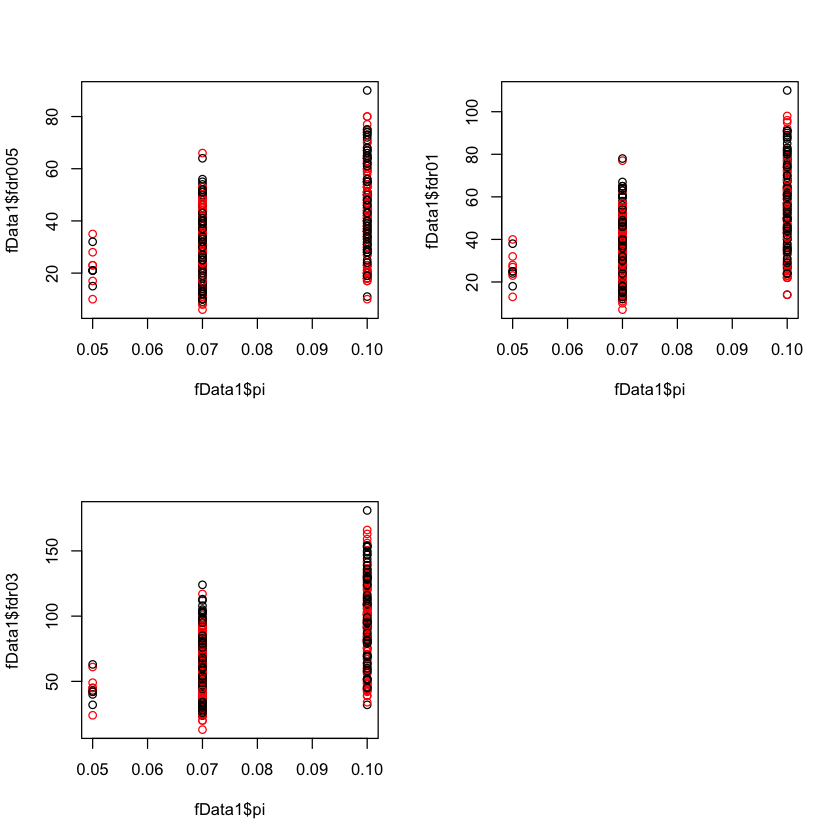

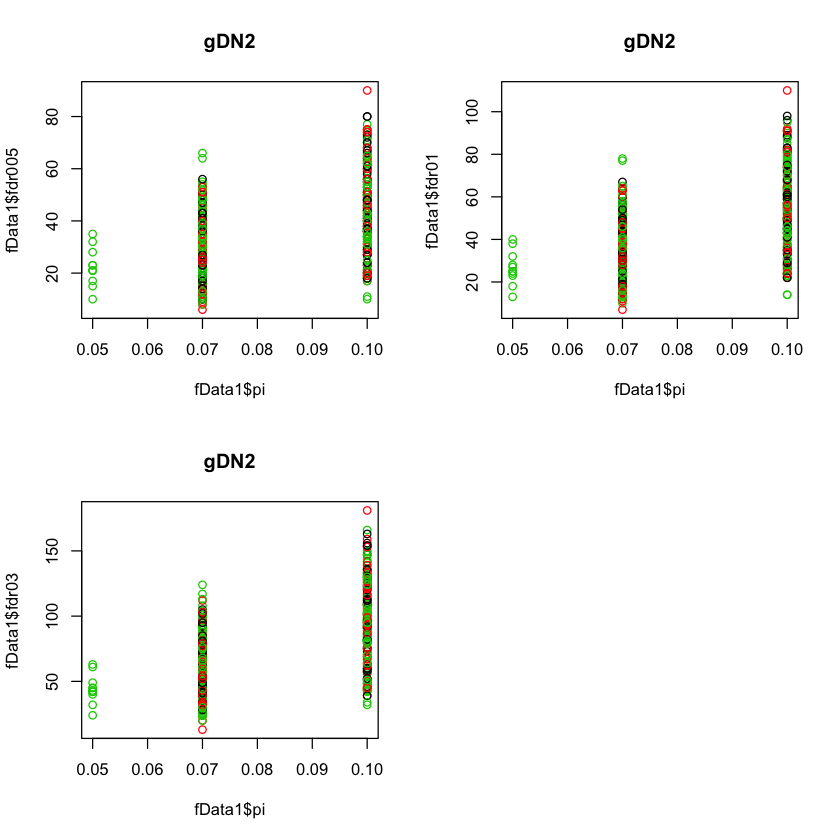

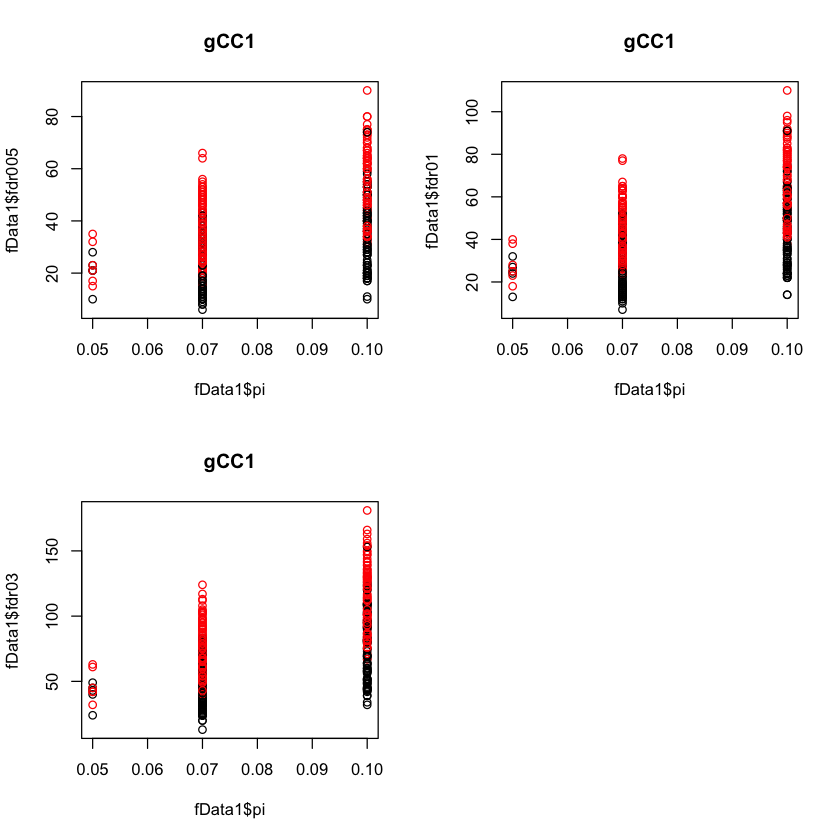

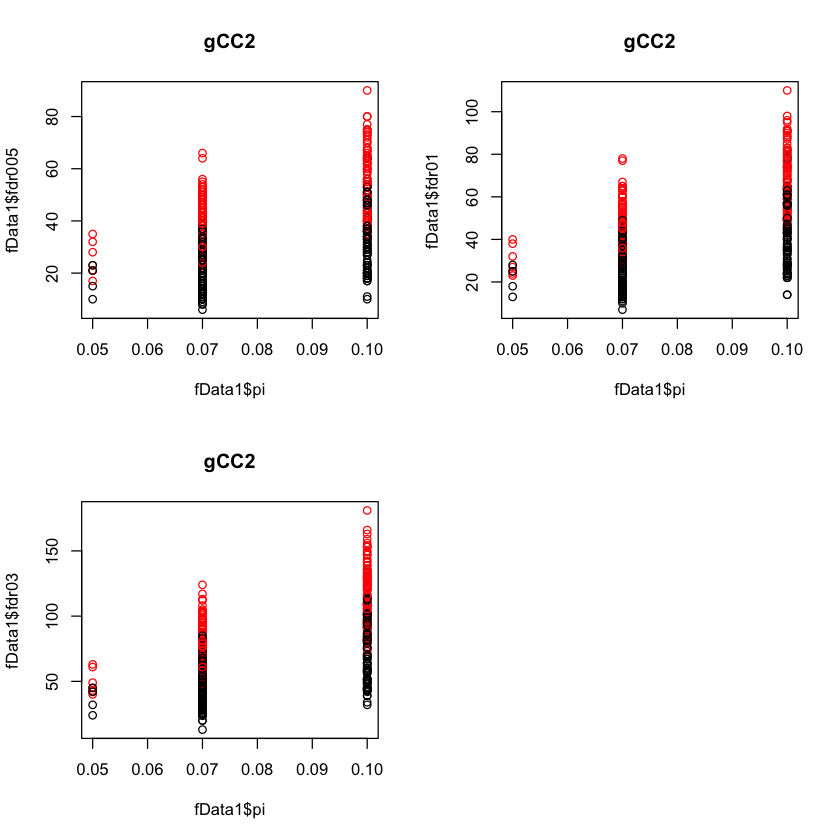

In [60]:
a.Pi <- unique(fData[, 1])
a.gDN1 <- unique(fData[, 2])
a.gCC1 <- unique(fData[, 3])
a.gDN2 <- unique(fData[, 4])
a.gCC2 <- unique(fData[, 5])

#a.gDN1
#a.gDN2
a.gCC2
par(mfrow = c(2, 2))

plot(fData1$pi, fData1$fdr005, col = ifelse(fData1$gDN1 == 15, 'red', 'black'))
plot(fData1$pi, fData1$fdr01, col = ifelse(fData1$gDN1 == 15, 'red', 'black'))
plot(fData1$pi, fData1$fdr03, col = ifelse(fData1$gDN1 == 15, 'red', 'black'))
par(mfrow = c(2, 2))

plot(fData1$pi, fData1$fdr005, col = fData1$gDN2, main = 'gDN2')
plot(fData1$pi, fData1$fdr01, col = fData1$gDN2, main = 'gDN2')
plot(fData1$pi, fData1$fdr03, col = fData1$gDN2, main = 'gDN2')

par(mfrow = c(2, 2))

plot(fData1$pi, fData1$fdr005, col = fData1$gCC1, main = 'gCC1')
plot(fData1$pi, fData1$fdr01, col = fData1$gCC1, main = 'gCC1')
plot(fData1$pi, fData1$fdr03, col = fData1$gCC1, main = 'gCC1')

par(mfrow = c(2, 2))

plot(fData1$pi, fData1$fdr005, col = fData1$gCC2, main = 'gCC2')
plot(fData1$pi, fData1$fdr01, col = fData1$gCC2, main = 'gCC2')
plot(fData1$pi, fData1$fdr03, col = fData1$gCC2, main = 'gCC2')


In [64]:
cor(fData)

,pi,gDN1,gCC1,gDN2,gCC2,epi,egDN1,egCC1,egDN2,egCC2,fdr005,fdr01,fdr03
pi,1.000000000,0.016769377,-0.012097277,-0.055934006,-0.009338526,0.674336954,0.033562299,0.009520640,-0.189760983,-0.084059424,0.455506299,0.480484279,0.529732806
gDN1,0.0167693773,1.0000000000,0.0215027223,-0.0087529232,0.0002742243,0.1442161422,0.4735788281,-0.0353816259,-0.0575044797,-0.0762559422,0.1043602788,0.1191252871,0.1437721389
gCC1,-0.01209728,0.02150272,1.00000000,0.01182340,-0.00545639,0.24475919,-0.22475306,0.83707969,-0.03386902,-0.21112539,0.49032876,0.48930616,0.48688827
gDN2,-0.055934006,-0.008752923,0.011823403,1.000000000,0.009928342,-0.048010680,-0.046996080,0.013956525,0.488569796,-0.016096681,-0.034007855,-0.037443618,-0.045436286
gCC2,-0.0093385260,0.0002742243,-0.0054563901,0.0099283422,1.0000000000,0.3972888634,-0.3638482537,-0.0783942793,-0.1452352419,0.6524458540,0.5857321604,0.5701298413,0.5359879320
epi,0.67433695,0.14421614,0.24475919,-0.04801068,0.39728886,1.00000000,-0.37488058,0.11027387,-0.36512956,-0.06734803,0.77885922,0.80409004,0.84918194
egDN1,0.03356230,0.47357883,-0.22475306,-0.04699608,-0.36384825,-0.37488058,1.00000000,-0.11887676,0.16015022,-0.02306396,-0.35019011,-0.33943229,-0.31216161
egCC1,0.00952064,-0.03538163,0.83707969,0.01395653,-0.07839428,0.11027387,-0.11887676,1.00000000,0.05252034,-0.20713101,0.38022712,0.37702497,0.37264069
egDN2,-0.18976098,-0.05750448,-0.03386902,0.48856980,-0.14523524,-0.36512956,0.16015022,0.05252034,1.00000000,0.02883803,-0.24349141,-0.25072956,-0.26978907
egCC2,-0.08405942,-0.07625594,-0.21112539,-0.01609668,0.65244585,-0.06734803,-0.02306396,-0.20713101,0.02883803,1.00000000,0.26857511,0.24300477,0.18980893



Attaching package: ‘gplots’

The following object is masked from ‘package:stats’:

    lowess



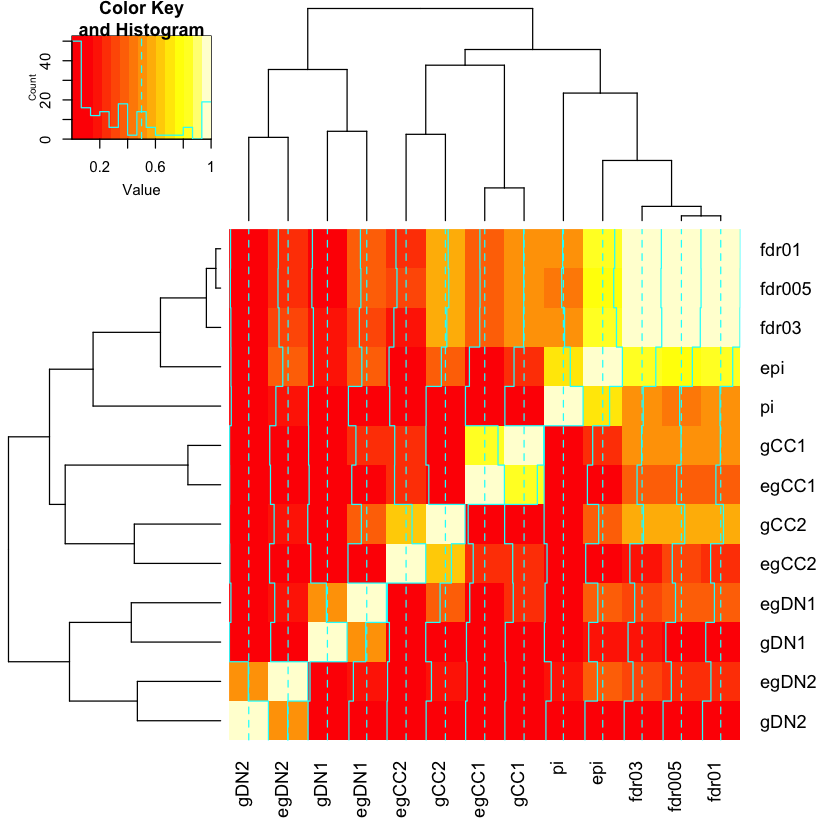

In [66]:
library("gplots")
heatmap.2(abs(cor(fData)))

In [32]:
colnames(data) <- c("DN1", "Case1", "Ctr1",
                   "DN2", "Case2", "Ctr2",
                    "Status",
                   "BF", "qvalue")
head(data, 24)
data2 <- data[data$Status ==1, ]

,DN1,Case1,Ctr1,DN2,Case2,Ctr2,Status,BF,qvalue
2261,0,0,0,0,234,60,1,1.494809e+32,0
18928,0,9,21,0,115,40,1,1.394132e+12,7.914835e-12
13681,0,0,0,0,126,46,1,948461775876,1.30325e-11
12205,0,0,0,0,114,44,1,10292275223,5.458243e-10
5062,0,0,0,0,86,29,1,479458642,9.64233e-09
4686,0,0,0,0,74,21,1,447170697,1.626058e-08
11502,0,0,0,0,201,124,1,21580284,1.600278e-07
3040,0,0,0,0,85,43,1,28216.96,9.782703e-05
3275,0,0,0,0,41,12,1,18290.34,0.0002208598
5308,0,2,4,0,61,29,1,10442.62,0.0004096611


In [17]:
dim(data1)

[1] 32  9

In [18]:
e.pi0

[1] 0.04971294

In [19]:
pi0

[1] 0.05

In [20]:
head(counts)

0,0,0,0,0,0
0,0,0,0,0,0
0,0,0,0,0,0
0,0,0,0,0,0
0,0,0,0,0,0
0,0,0,0,0,0


In [21]:
dim(data[data$qvalue < 0.1, ])

[1] 18  9

In [22]:
dim(data[data$BF > 1,])

[1] 215   9

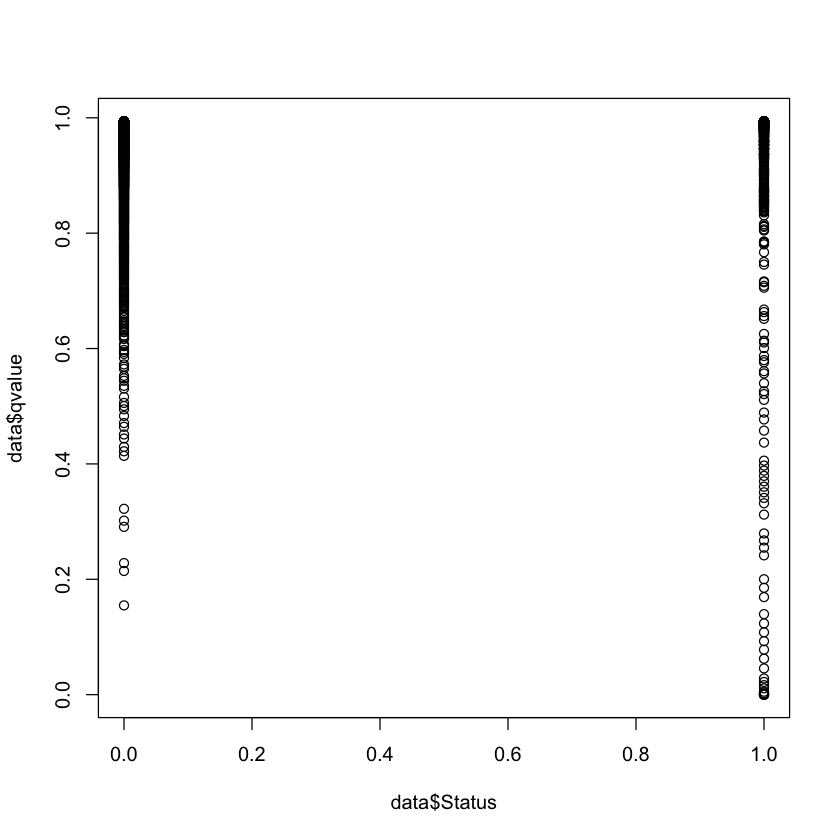

In [23]:
plot(data$Status, data$qvalue)

In [24]:
cor(data$Status, data$BF)

[1] 0.03264942

In [14]:
table(data$Status)


    0     1 
19389  1018 

In [34]:
head(data2[data2$BF < 1, ])

,DN1,Case1,Ctr1,DN2,Case2,Ctr2,Status,BF,qvalue
7946,0,0,0,0,5,1,1,0.9914118,0.7752939
19138,0,18,35,0,8,5,1,0.959602,0.7807659
2874,1,0,0,0,0,0,1,0.947256,0.7825281
1181,1,0,0,0,0,0,1,0.9461543,0.7842571
2711,1,0,0,0,0,0,1,0.9460362,0.785109
16752,1,0,0,0,0,0,1,0.9450634,0.7859528


In [35]:
simulator

function (N, mu, mu.frac, pi, gamma.mean.dn, beta.dn, gamma.mean.CC, 
    beta.CC, rho1, nu1, rho0, nu0, tradeoff = FALSE) 
{
    m <- length(mu)
    K <- length(mu.frac)
    delta <- mean(mu) * mu.frac/(rho0/nu0)
    z <- rbinom(m, 1, pi)
    gamma.dn <- array(1, dim = c(m, K))
    gamma.CC <- array(1, dim = c(m, K))
    q <- array(0, dim = c(m, K))
    x <- array(0, dim = c(m, 3 * K))
    k <- sum(z == 1)
    for (j in 1:K) {
        gamma.dn[z == 1, j] <- rgamma(k, gamma.mean.dn[j] * beta.dn[j], 
            beta.dn[j])
        col <- 3 * (j - 1) + 1
        x[, col] <- rpois(m, 2 * mu * mu.frac[j] * gamma.dn[, 
            j] * N$dn)
        gamma.CC[z == 1, j] <- rgamma(k, gamma.mean.CC[j] * beta.CC[j], 
            beta.CC[j])
        q[z == 0, j] <- rgamma(m - k, rho0[j], nu0[j])
        if (tradeoff == FALSE) {
            q[z == 1, j] <- rgamma(k, rho1[j], nu1[j])
        }
        else {
            q[z == 1, j] <- mu[z == 1] * mu.frac[j]/(delta[j] * 
                gamma.CC[z == 1, j])
        }
        x[, col + 1] <- rpois(m, q[, j] * gamma.CC[, j] * N$ca)
        x[, col + 2] <- rpois(m, q[, j] * N$cn)
    }
    sample.info <- cbind(mu, z, gamma.dn, gamma.CC, q, x)
    return(list(sample = x, sample.info = sample.info))
}